In [1]:
import pinecone

pinecone.init(api_key="APIKEY", environment="us-west4-gcp-free")

c:\Users\HP\anaconda3\envs\wsl\Lib\site-packages\pinecone\index.py:4: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from tqdm.autonotebook import tqdm


In [2]:
captions = []
with open("4000.txt") as file:
    while line := file.readline():
        t = line.split("~")
        captions.append((t[0].strip(), t[1].strip()))

print(len(captions))

4000


In [3]:
captions[0]

('street signs on a street near a wooded area',
 '/content/drive/MyDrive/wsl/CAM_FRONT/n010-2018-07-10-10-37-43+0800__CAM_FRONT__1531190655262488.jpg')

In [6]:
from sentence_transformers import SentenceTransformer
# model = SentenceTransformer('bert-base-nli-mean-tokens')
model = SentenceTransformer('all-MiniLM-L6-v2')

In [7]:
sentences = [t[0] for t in captions]

In [10]:
sentences[0]

'street signs on a street near a wooded area'

In [11]:
embeddings = model.encode(sentences)

In [17]:
embeddings[0].shape

(384,)

In [18]:
# Index to perform ANN search, using euclidean distance metric.
pinecone.create_index(name="my-index", dimension=384, metric="euclidean", index_type="approximated")   # This index_type is also the default.

- Time to create 384-d index is 10:58 minutes

In [19]:
pinecone.list_indexes()

['my-index']

In [20]:
# Connect to the index.
index = pinecone.Index(index_name="my-index")

In [35]:
upsert_data = [(str(i), [float(e) for e in embeddings[i]]) for i in range(0, len(embeddings))]

In [36]:
type(upsert_data[0][1][0])

float

In [37]:
upsert_data[1]

('1',
 [0.025105083361268044,
  0.008600153960287571,
  -0.01604551263153553,
  0.02929312363266945,
  -0.056350164115428925,
  0.053240854293107986,
  0.10226805508136749,
  -0.025790927931666374,
  -0.00905761867761612,
  -0.048253133893013,
  0.0760611742734909,
  0.018212364986538887,
  -0.0008642106549814343,
  -0.0332520417869091,
  -0.025801358744502068,
  0.009798824787139893,
  -0.028492029756307602,
  -0.028833666816353798,
  0.015958016738295555,
  -0.016993407160043716,
  -0.0673450455069542,
  -0.054379213601350784,
  -0.00681384839117527,
  -0.0010836654109880328,
  -0.127847358584404,
  0.04020468890666962,
  0.06088443845510483,
  0.031124381348490715,
  0.07865980267524719,
  -0.016685694456100464,
  0.0526244193315506,
  -0.032917749136686325,
  0.0272067841142416,
  0.030752697959542274,
  -0.12842655181884766,
  -0.033871572464704514,
  0.050261761993169785,
  0.029599636793136597,
  0.05486026406288147,
  0.04241082817316055,
  -0.0010683879954740405,
  -0.08479961

In [40]:
# Insert data.
# Upsert: insert a new vector, or update if same Id exists.
for i in range(0, 40):
    index.upsert(upsert_data[i*100:(i + 1)*100])

- Upsert 100 * 40 embeddings in 1:13 seconds.

When upserting larger amounts of data, upsert data in batches of 100 vectors or fewer over multiple upsert requests.

In [41]:
index.describe_index_stats()

{'dimension': 384,
 'index_fullness': 0.0,
 'namespaces': {'': {'vector_count': 4000}},
 'total_vector_count': 4000}

In [46]:
query_vector = [float(e) for e in model.encode(["a street with cars parked on either side of it"])[0]]

In [47]:
query_vector

[0.00824647955596447,
 0.07544659078121185,
 -0.00197454821318388,
 0.061607930809259415,
 -0.01384922955185175,
 0.049021873623132706,
 0.052322424948215485,
 0.014367915689945221,
 0.015693193301558495,
 -0.07630538940429688,
 0.062259379774332047,
 0.04918613284826279,
 0.03121013008058071,
 0.04335310310125351,
 -0.009851661510765553,
 0.039909474551677704,
 -0.024547401815652847,
 0.005475778132677078,
 0.045712631195783615,
 0.03435720503330231,
 -0.10678745061159134,
 -0.019206034019589424,
 -0.0126161128282547,
 -0.01300942711532116,
 -0.10616551339626312,
 0.07096309959888458,
 0.015445810742676258,
 0.11778423935174942,
 5.8015473769046366e-05,
 -0.02376534976065159,
 0.019455982372164726,
 -0.0030339607037603855,
 -0.023145951330661774,
 0.026661192998290062,
 0.045425545424222946,
 -0.0817154198884964,
 -0.04764115437865257,
 0.028872793540358543,
 0.08037526905536652,
 -0.008784946985542774,
 -0.03830276429653168,
 -0.04244271665811539,
 -0.017021937295794487,
 -0.02422531

In [49]:
# Query the DB.
res = index.query(
  vector=query_vector,
  top_k=5,
  include_values=True
)

res

{'matches': [{'id': '2835',
              'score': 0.0,
              'values': [0.00824643,
                         0.0754465833,
                         -0.00197454169,
                         0.0616079718,
                         -0.013849237,
                         0.0490218624,
                         0.0523223616,
                         0.0143678905,
                         0.0156931635,
                         -0.0763053894,
                         0.0622593872,
                         0.0491861291,
                         0.0312101115,
                         0.043353118,
                         -0.00985166244,
                         0.0399094932,
                         -0.024547426,
                         0.0054758084,
                         0.0457126386,
                         0.0343571678,
                         -0.106787466,
                         -0.0192060415,
                         -0.0126160979,
                         -0.013009469,
    

In [59]:
images = []

for e in res['matches']:
    images.append(captions[int(e['id'])][1].split("/")[-1])
    print(sentences[int(e['id'])])
    print(captions[int(e['id'])][1])
    print("")

a street with cars parked on either side of it
/content/drive/MyDrive/wsl/CAM_FRONT/n013-2018-08-21-14-27-06+0800__CAM_FRONT__1534833047412407.jpg

a street with cars parked on both sides of it
/content/drive/MyDrive/wsl/CAM_FRONT/n013-2018-07-31-10-43-27+0800__CAM_FRONT__1533005564612407.jpg

a street that has cars parked on either side
/content/drive/MyDrive/wsl/CAM_FRONT/n016-2018-07-05-17-10-34+0800__CAM_FRONT__1530782381912515.jpg

a street with cars parked on the side of the road
/content/drive/MyDrive/wsl/CAM_FRONT/n015-2018-07-11-16-55-34+0800__CAM_FRONT__1531299496262460.jpg

a street with cars parked along side of the street
/content/drive/MyDrive/wsl/CAM_FRONT/n013-2018-08-20-11-35-39+0800__CAM_FRONT__1534736557912407.jpg



In [56]:
base = "../data/sets/nuimages/samples/CAM_FRONT/"
query_path = "n013-2018-08-28-10-41-15+0800__CAM_FRONT__1535424130762428.jpg"

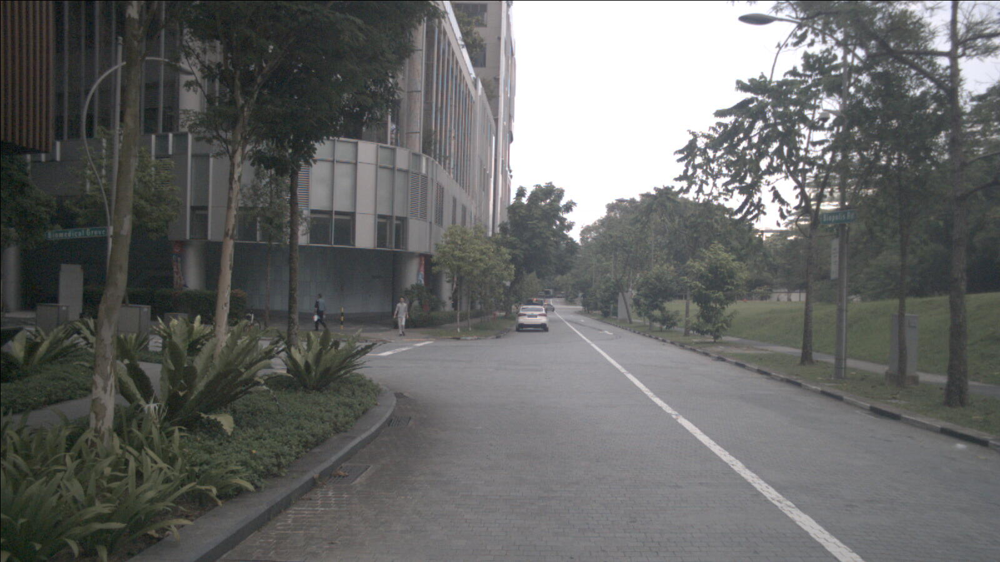

In [57]:
from IPython.display import display
from PIL import Image

display(Image.open(base + query_path))

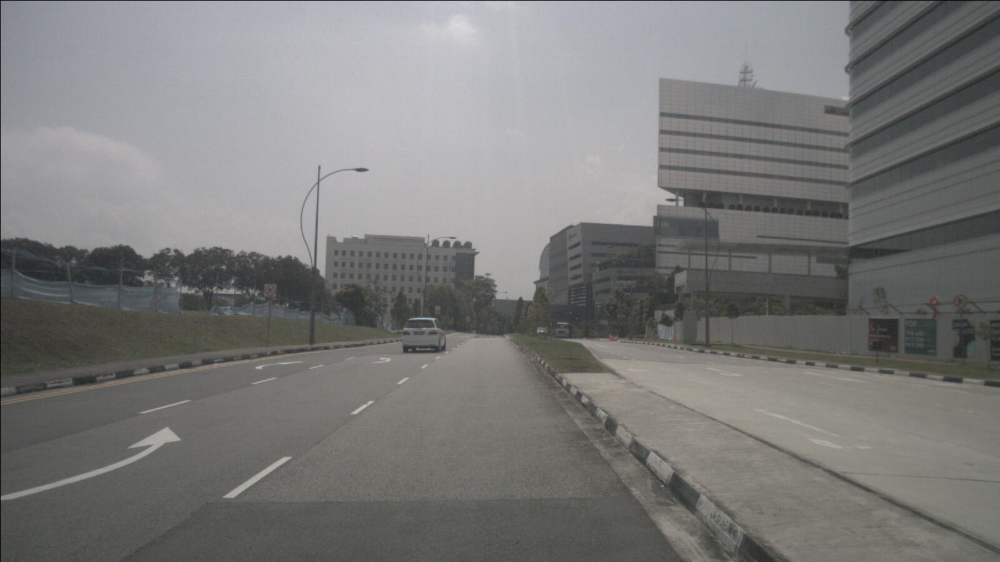

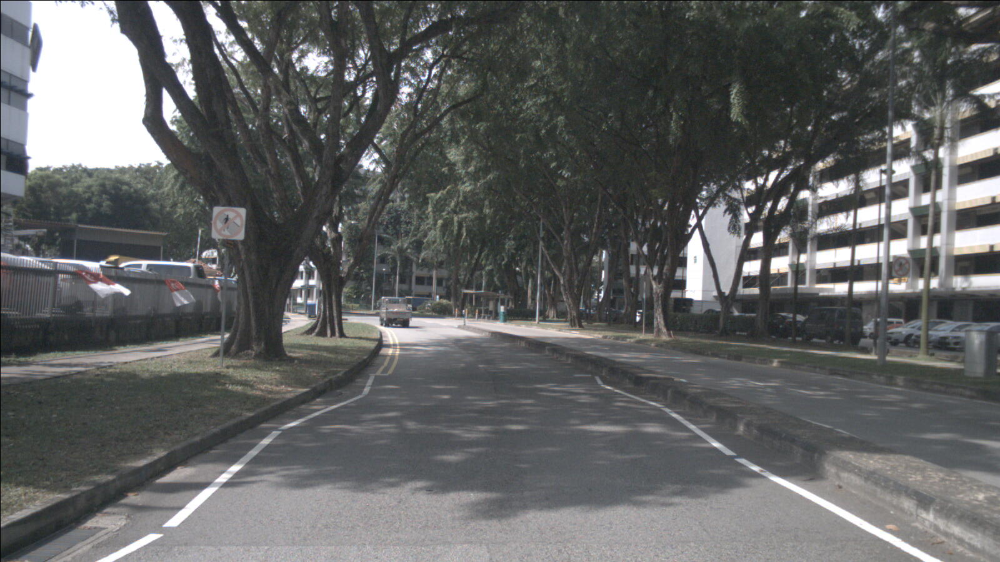

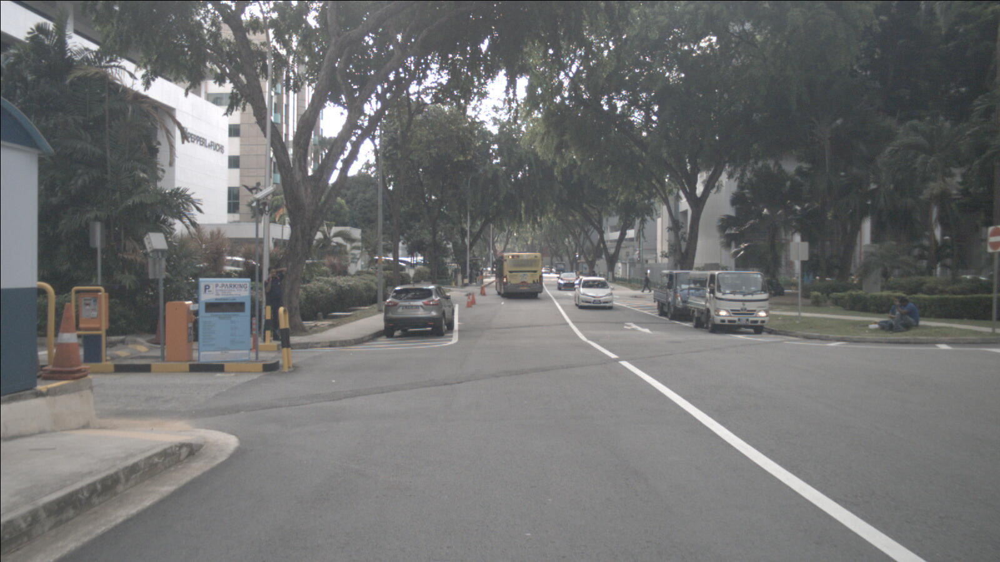

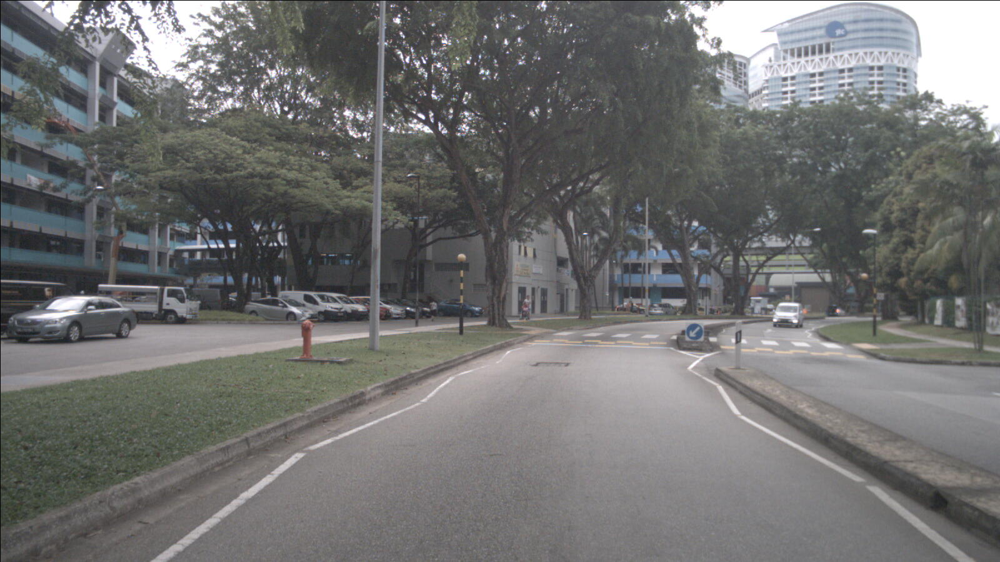

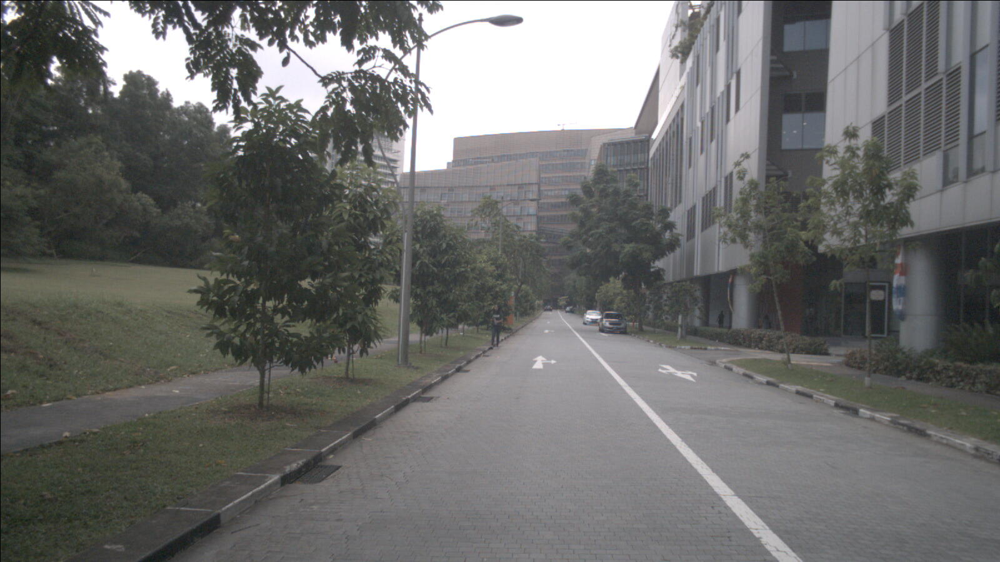

In [60]:
for _ in images:
    display(Image.open(base + _))

In [61]:
# Delete an index when no longer needed.
pinecone.delete_index("my-index")